In [3]:
#import all the modeules we've used before
 
import itertools
import numpy as np
import pandas as pd
import statsmodels.api as sm
from matplotlib import pyplot as plt
import seaborn as sns

from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem
import rdkit
# Render the figure in a notebook:
%matplotlib inline  

from scipy import stats

from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score

In [4]:
df_x = pd.read_csv('no_nontoxic_nans_X_train.csv')

df_y = pd.read_csv('no_nontoxic_nans_y_train.csv')

In [5]:
import pandas as pd
df = pd.read_csv('no_nontoxic_nans_desc_and_toxicity.csv')
df

,Unnamed: 0,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,smiles,mol_id,toxic
0,0,11.107593,11.107593,0.073011,-3.723219,0.900283,11.875000,258.324,248.244,258.013284,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,CCOc1ccc2nc(S(N)(=O)=O)sc2c1,TOX3021,1
1,1,10.251875,10.251875,0.383488,-5.197724,0.365583,15.090909,206.027,197.963,205.974526,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CC(O)(P(=O)(O)O)P(=O)(O)O,TOX20800,0
2,2,10.598302,10.598302,0.135802,-3.530602,0.609724,11.300000,176.624,171.584,175.969878,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,O=S(=O)(Cl)c1ccccc1,TOX6619,0
3,3,10.775986,10.775986,0.010525,-0.858003,0.489304,10.428571,621.934,612.862,621.763503,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,O=C(O)Cc1cc(I)c(Oc2ccc(O)c(I)c2)c(I)c1,TOX25232,1
4,4,10.825046,10.825046,0.001157,-0.103056,0.564836,10.600000,144.214,128.086,144.115030,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CC(C)COC(=O)C(C)C,TOX6612,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5270,5270,5.437662,5.437662,0.327913,0.327913,0.856312,17.727273,298.346,280.202,298.142976,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,c1cnc(N2CCN(Cc3ccc4c(c3)OCO4)CC2)nc1,TOX25188,0
5271,5271,12.146718,12.146718,0.245103,0.245103,0.701319,49.000000,314.469,284.229,314.224580,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CC(=O)[C@H]1CC[C@H]2[C@@H]3CCC4=CC(=O)CC[C@]4(...,TOX2370,1
5272,5272,11.787348,11.787348,0.082288,-0.082288,0.734230,52.714286,288.431,260.207,288.208930,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C[C@]12CC[C@H]3[C@@H](CCC4=CC(=O)CC[C@@]43C)[C...,TOX2371,1
5273,5273,10.372487,10.372487,0.088273,-0.088273,0.757170,42.700000,272.388,248.196,272.177630,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C[C@]12CC[C@@H]3c4ccc(O)cc4CC[C@H]3[C@@H]1CC[C...,TOX2377,1


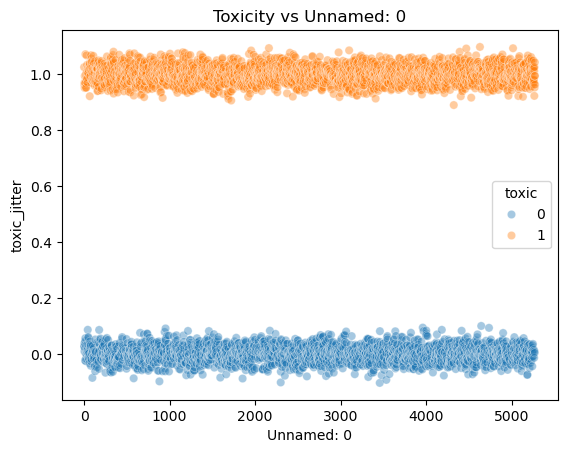

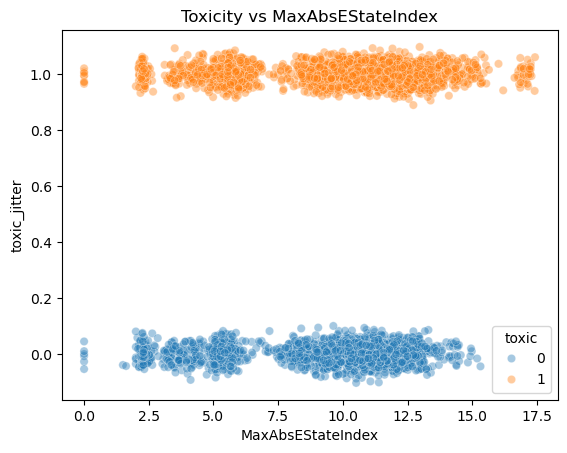

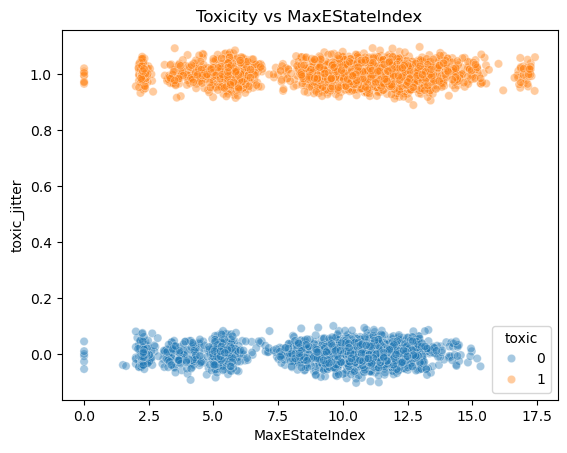

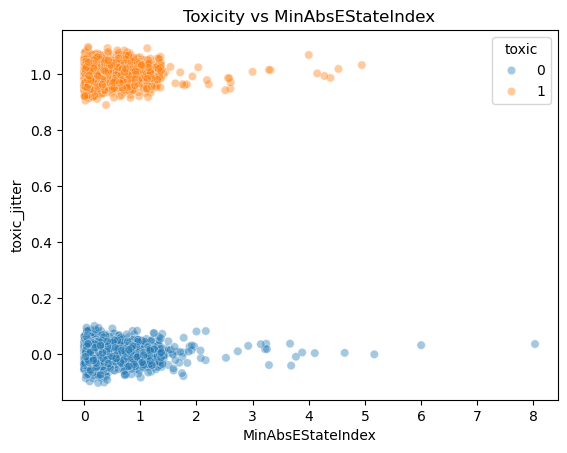

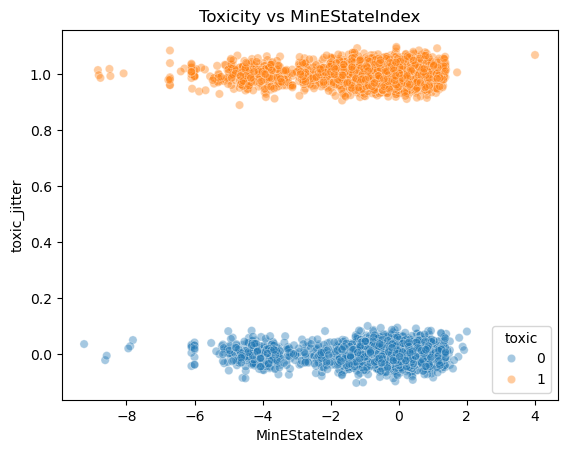

...

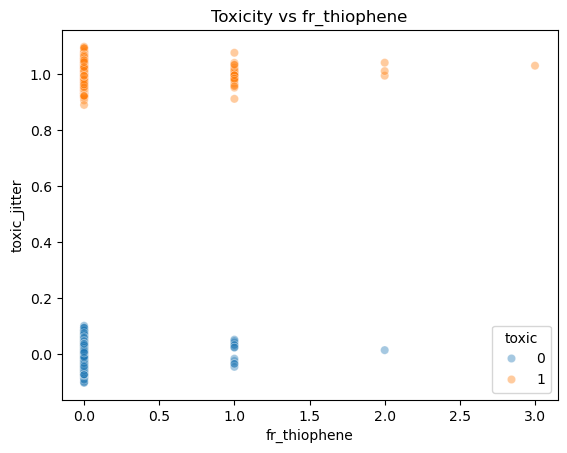

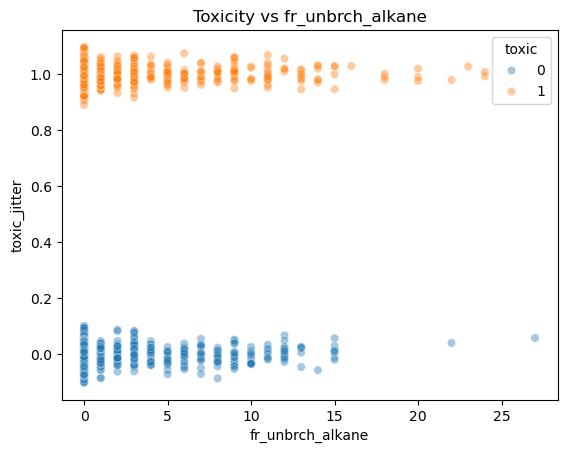

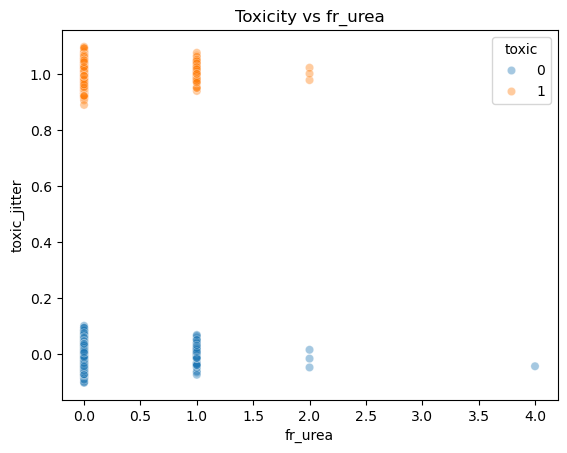

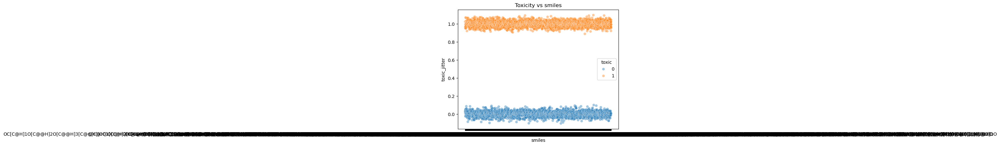

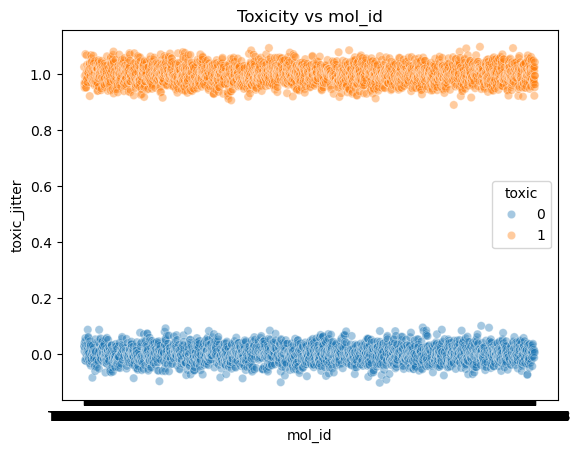

In [6]:
df['toxic_jitter'] = df['toxic'] + np.random.normal(0, 0.03, size=len(df))

for feature in df.columns:
    if feature in ['toxic', 'toxic_jitter']:
        continue

    sns.scatterplot(
        data=df,
        x=feature,
        y='toxic_jitter',
        hue='toxic',
        alpha=0.4
    )
    plt.title(f"Toxicity vs {feature}")
    plt.show()

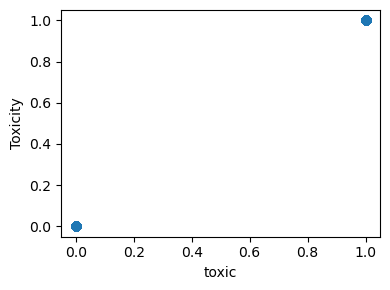

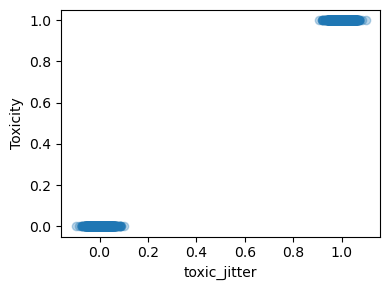

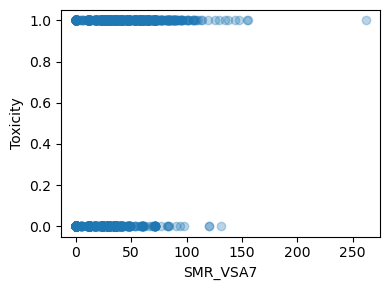

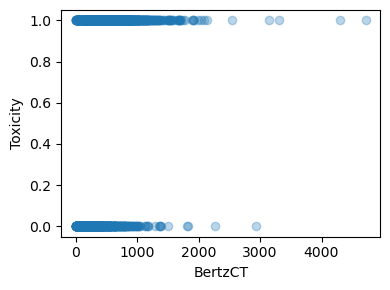

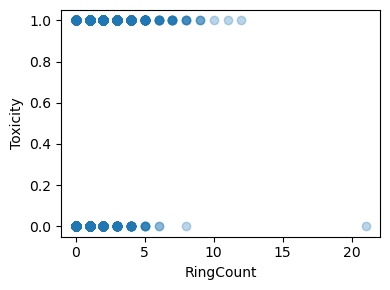

...

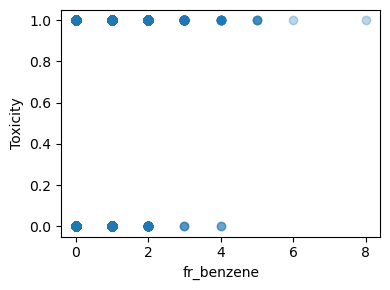

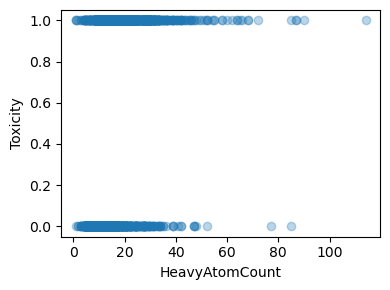

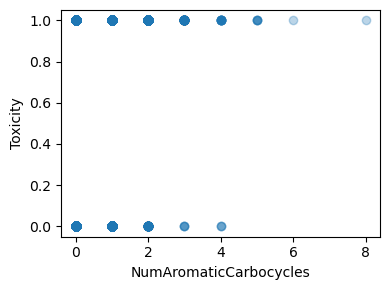

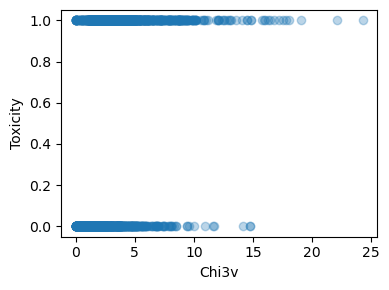

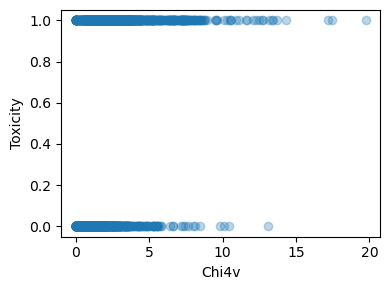

In [7]:
# helps identify candidate features for subsequent QSAR modeling and feature selection.
# top 20 descriptors associated with toxicity
# takes randomly 2000 sample points without bias. cut the computational cost 
df_plot = df.sample(2000, random_state=42)

corr = df_plot.corr(numeric_only=True)['toxic'].abs()
top_features = corr.sort_values(ascending=False).head(20).index

for feature in top_features:
    plt.figure(figsize=(4,3))
    plt.scatter(df_plot[feature], df_plot['toxic'], alpha=0.3)
    plt.xlabel(feature)
    plt.ylabel("Toxicity")
    plt.tight_layout()
    plt.show()

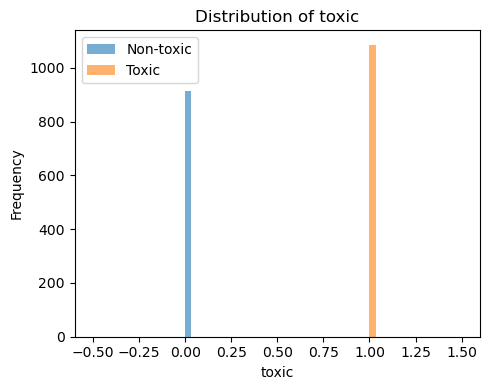

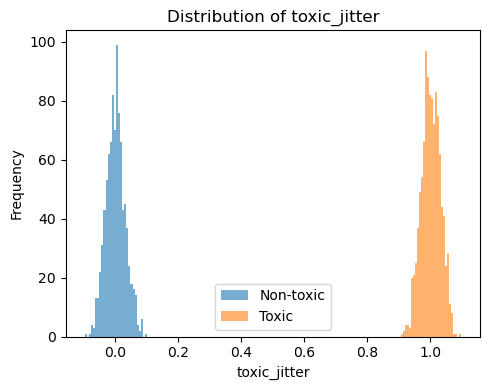

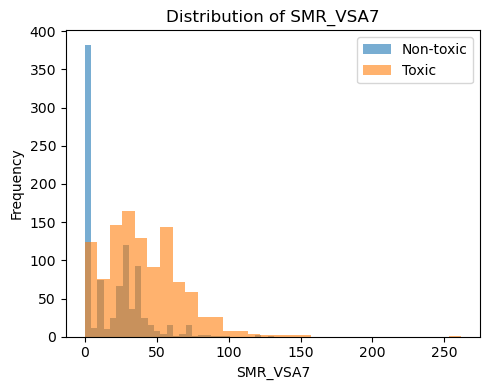

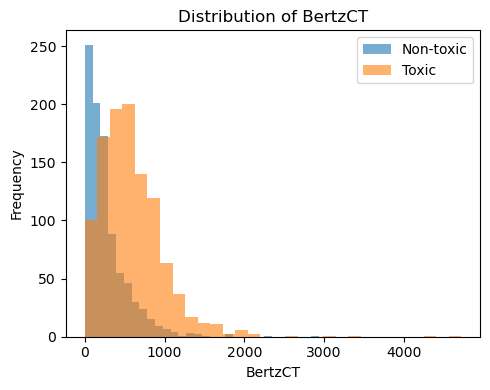

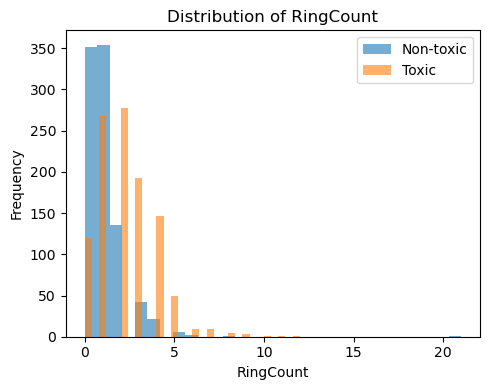

...

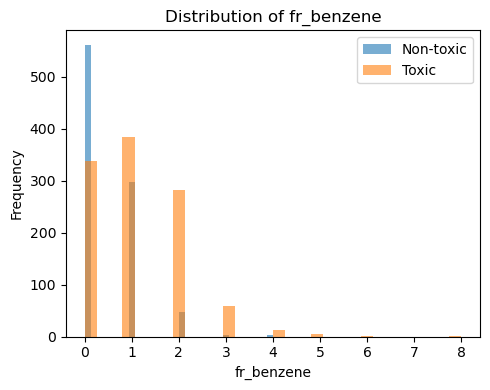

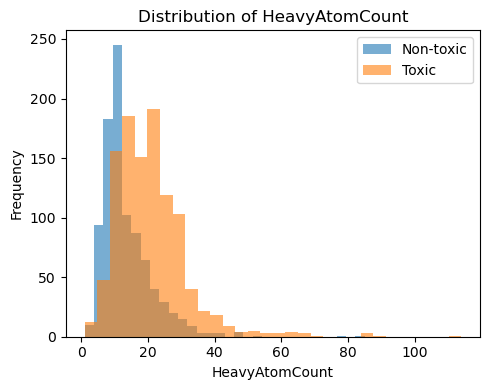

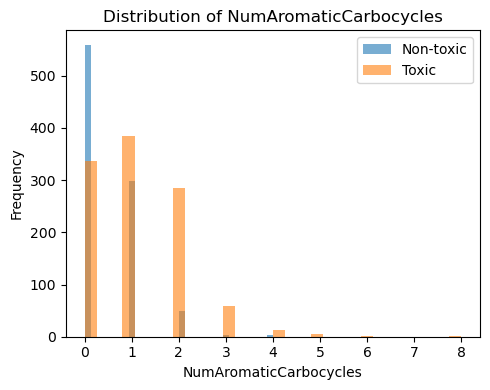

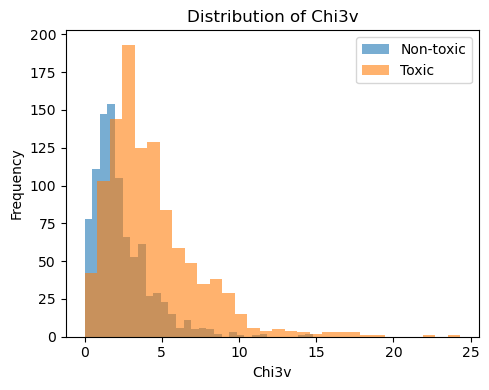

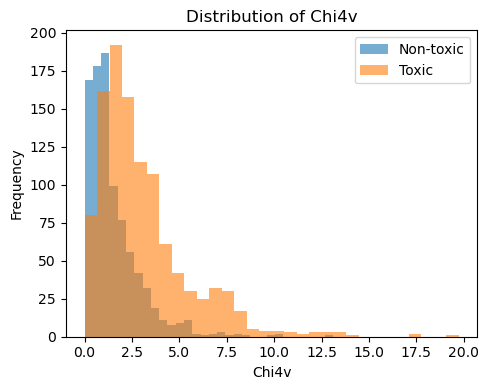

In [8]:
for feature in top_features:
    plt.figure(figsize=(5,4))

    plt.hist(df_plot[df_plot['toxic']==0][feature],
             bins=30, alpha=0.6, label='Non-toxic')

    plt.hist(df_plot[df_plot['toxic']==1][feature],
             bins=30, alpha=0.6, label='Toxic')

    plt.xlabel(feature)
    plt.ylabel("Frequency")
    plt.title(f"Distribution of {feature}")
    plt.legend()
    plt.tight_layout()
    plt.show()

C:\Users\dy25544\AppData\Local\Temp\ipykernel_7356\1960466880.py:3: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_plot[df_plot['toxic']==0][feature], label='Non-toxic', fill=True)
C:\Users\dy25544\AppData\Local\Temp\ipykernel_7356\1960466880.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_plot[df_plot['toxic']==1][feature], label='Toxic', fill=True)
C:\Users\dy25544\AppData\Local\Temp\ipykernel_7356\1960466880.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


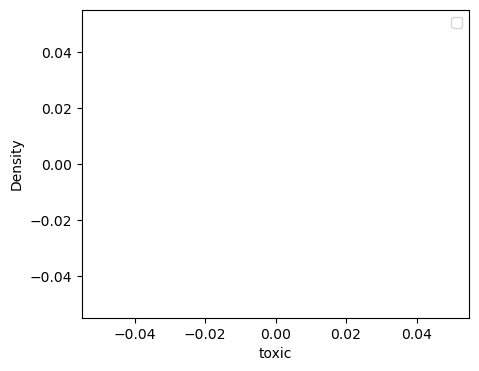

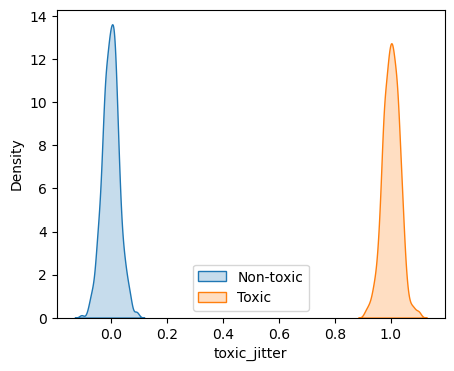

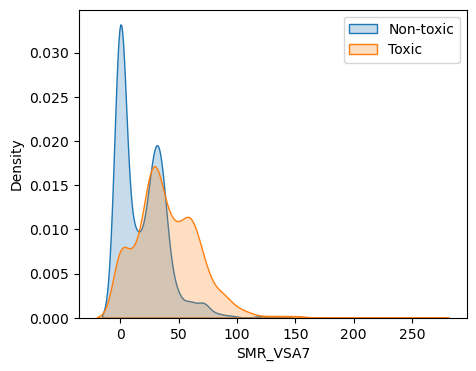

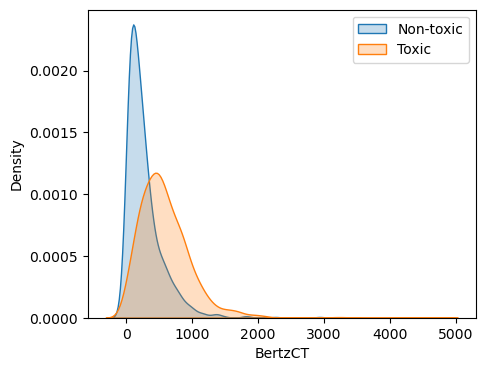

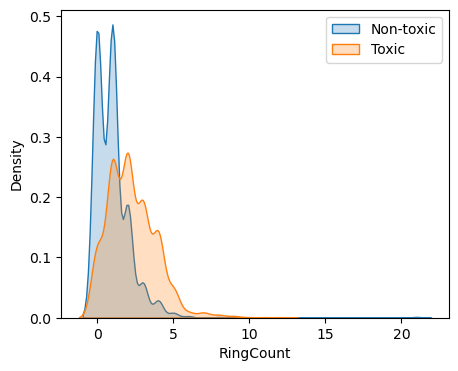

...

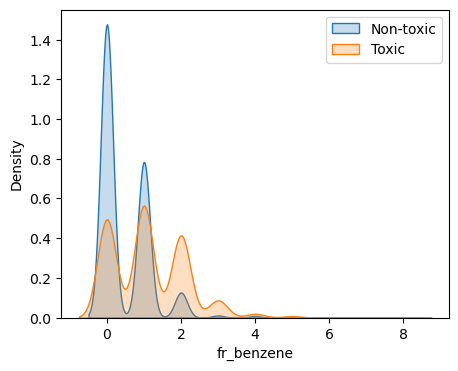

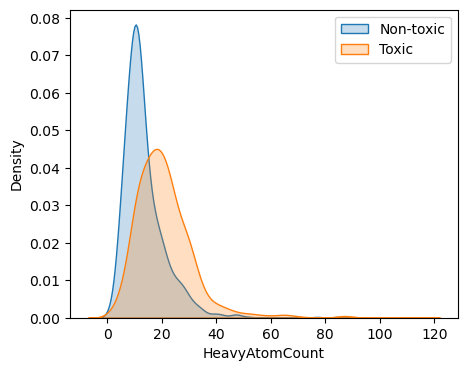

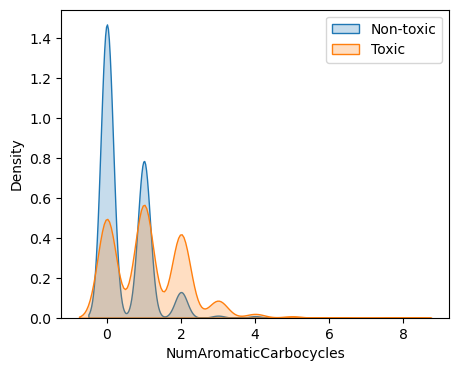

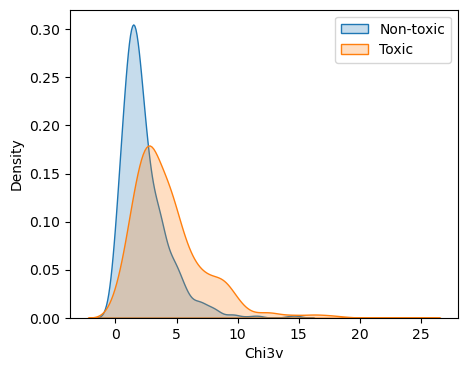

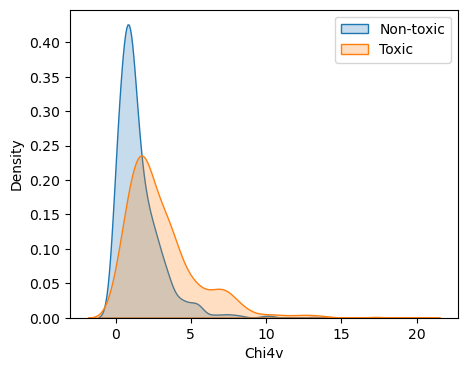

In [12]:
for feature in top_features:
    plt.figure(figsize=(5,4))
    sns.kdeplot(df_plot[df_plot['toxic']==0][feature], label='Non-toxic', fill=True)
    sns.kdeplot(df_plot[df_plot['toxic']==1][feature], label='Toxic', fill=True)
    plt.xlabel(feature)
    plt.ylabel("Density")
    plt.legend()
    plt.show()

🥇 1. Boxplots / Violin plots (Top priority for binary data)
Why?
For binary toxicity, these are more informative than scatter plots.They show:
Median shift
Interquartile range
Outliers
Class separation

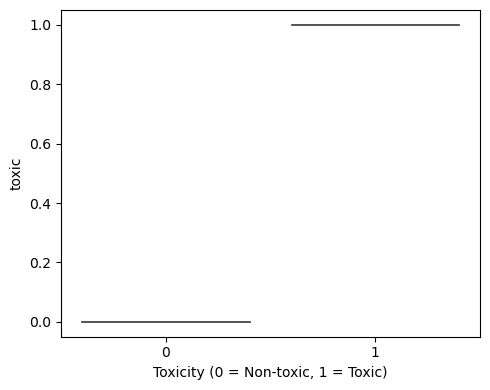

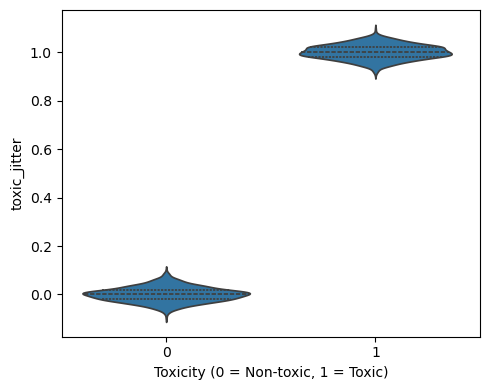

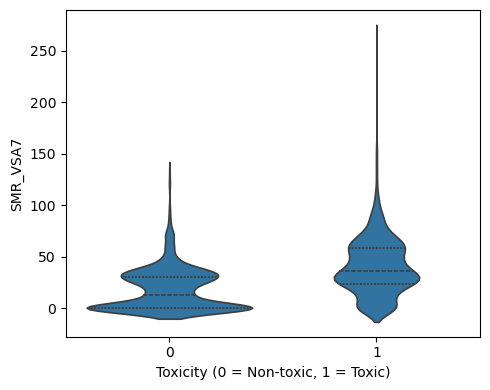

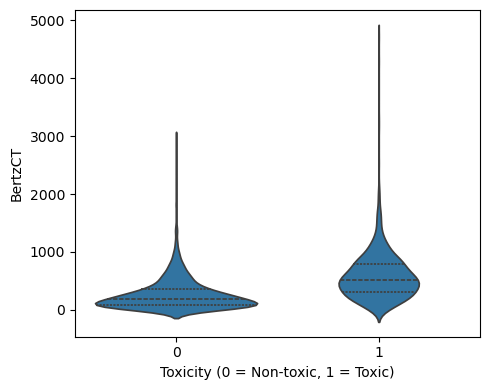

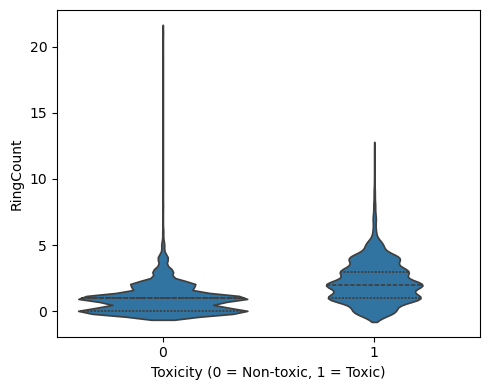

...

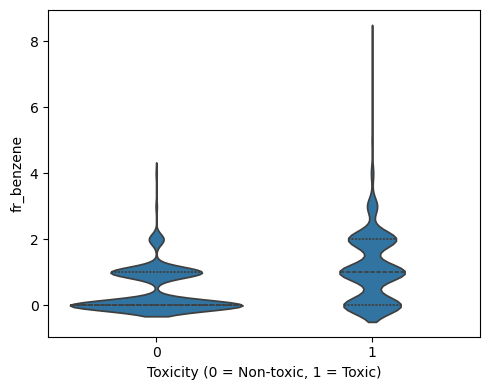

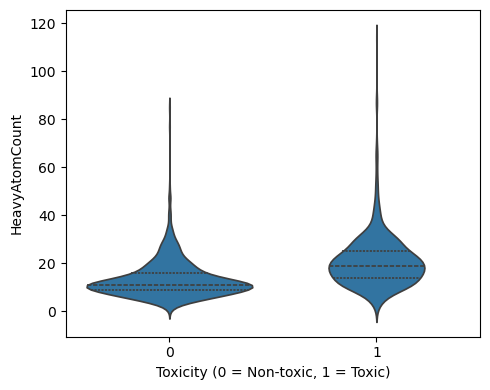

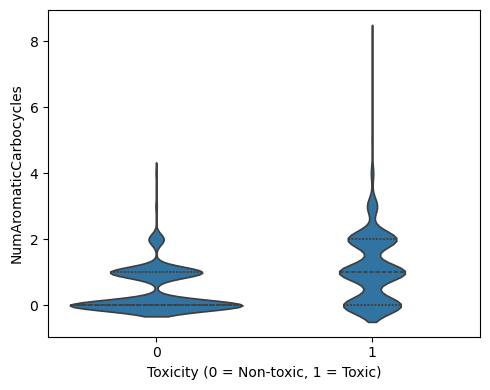

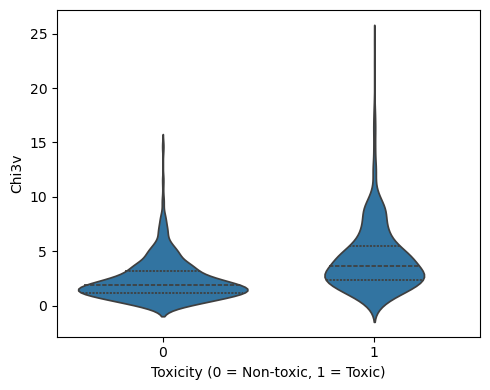

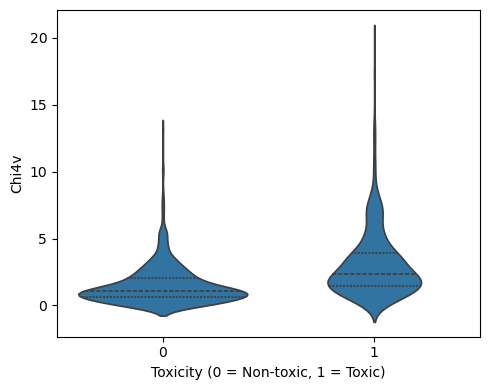

In [9]:
for feature in top_features:
    plt.figure(figsize=(5,4))
    sns.violinplot(x='toxic', y=feature, data=df_plot, inner='quartile')
    plt.xlabel("Toxicity (0 = Non-toxic, 1 = Toxic)")
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show()

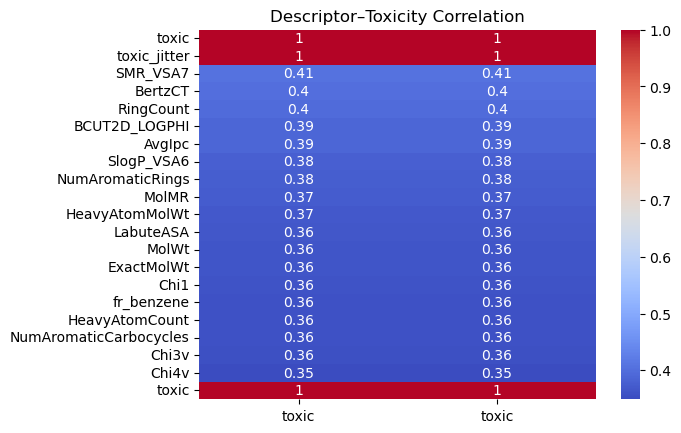

In [10]:
corr = df_plot[top_features.tolist() + ['toxic']].corr()

sns.heatmap(corr[['toxic']], annot=True, cmap='coolwarm')
plt.title("Descriptor–Toxicity Correlation")
plt.show()